In [ ]:
!pip install lime shap -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 23.9 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import lime
import lime.lime_tabular
import numpy as np
import keras
import shap
import numpy as np


# Question ONE

### Section One

In [ ]:
data = '/content/diabetes.csv'
diabet = pd.read_csv(data)
diabet.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


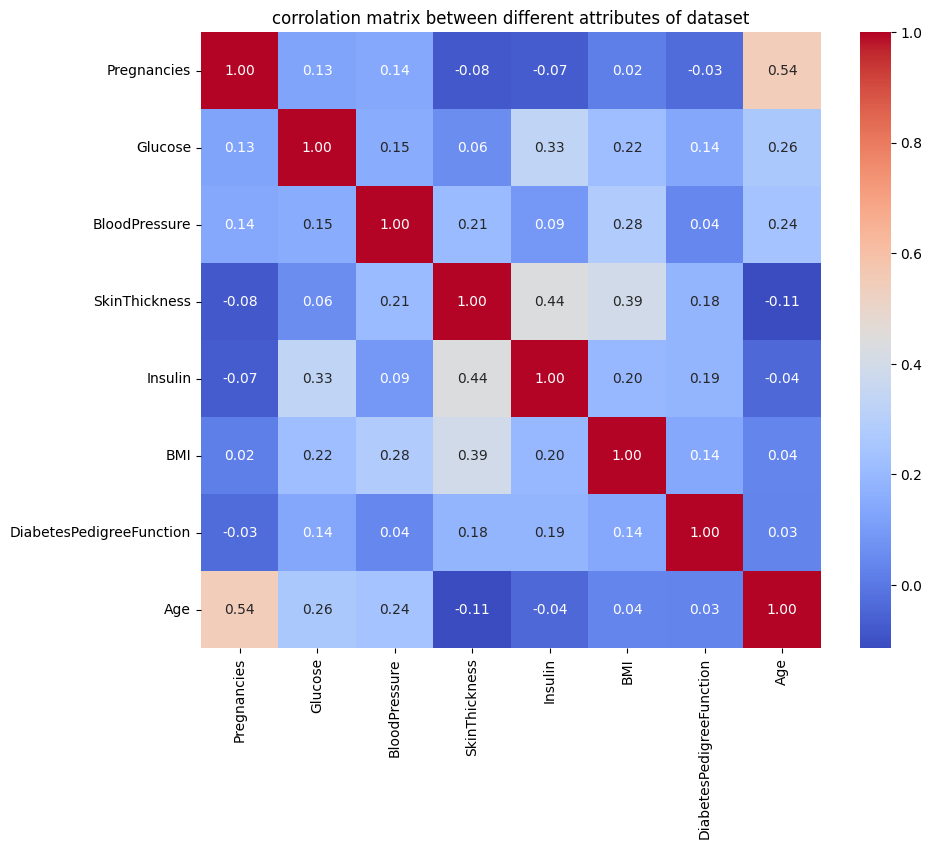

In [ ]:
corrolation_matrix = diabet.drop("Outcome", axis = 1).corr()
plt.figure(figsize = (10,8))
sns.heatmap(corrolation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('corrolation matrix between different attributes of dataset')
plt.show()



*   Diabet Positive = 1
*   Diabet Negative = 0


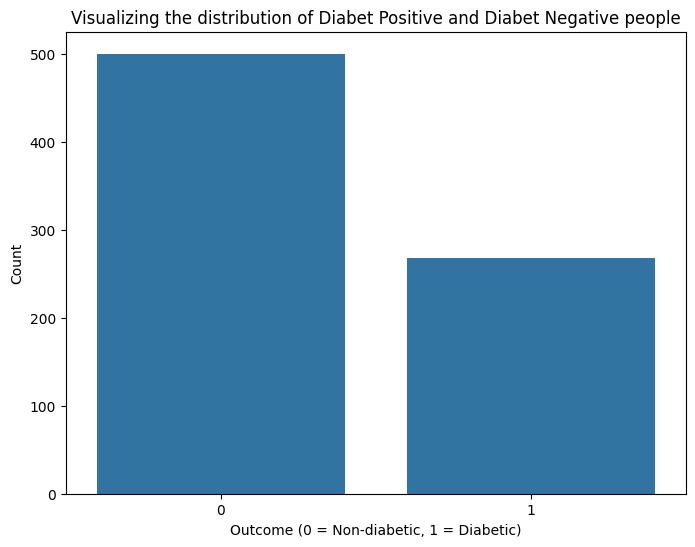

Outcome
0    65.104167
1    34.895833
Name: proportion, dtype: float64

In [ ]:
plt.figure(figsize = (8, 6))
sns.countplot(x = 'Outcome', data = diabet)
plt.title('Visualizing the distribution of Diabet Positive and Diabet Negative people')
plt.xlabel('Outcome (0 = Non-diabetic, 1 = Diabetic)')
plt.ylabel('Count')
plt.show()

class_counts = diabet['Outcome'].value_counts(normalize=True) * 100
class_counts

###### For detecting outliers we use IDR metrics, each datapoints that holds true in the following inequlaity is outlier:

datapoint >= 1.5 * IQR

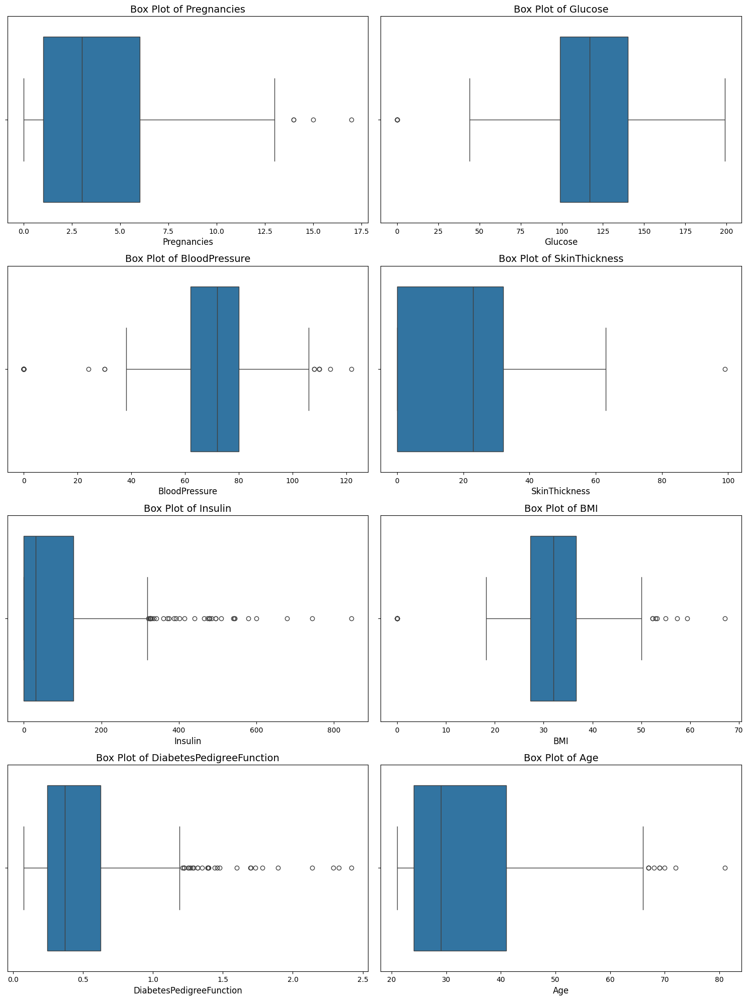

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))
axes = axes.flatten()  
outlier_columns = []

for i, column in enumerate(diabet.drop('Outcome', axis=1).columns):
    Q1 = diabet[column].quantile(0.25)
    Q3 = diabet[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    if ((diabet[column] < lower_bound) | (diabet[column] > upper_bound)).any():
        outlier_columns.append(column)

    sns.boxplot(x=diabet[column], ax=axes[i])
    axes[i].set_title(f'Box Plot of {column}', fontsize=14)
    axes[i].set_xlabel(f'{column}', fontsize=12)

plt.tight_layout()
plt.show()

outlier_columns


### Section Two

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler

X = diabet.drop('Outcome', axis=1)
y = diabet['Outcome']

scaler = RobustScaler()
X_scaled = scaler.fit_transform(X)

X_train_val, X_test, y_train_val, y_test = train_test_split(X_scaled, y, test_size=0.20, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.125, random_state=42)  # 0.125 * 0.8 = 0.1

print(f"Training set size: {X_train.shape[0]} samples")
print(f"Validation set size: {X_val.shape[0]} samples")
print(f"Test set size: {X_test.shape[0]} samples")


Training set size: 537 samples
Validation set size: 77 samples
Test set size: 154 samples


### Section Three

Epoch 1/20
3/3 [==============================] - 2s 202ms/step - loss: 0.6664 - accuracy: 0.6108 - val_loss: 0.6683 - val_accuracy: 0.7013
Epoch 2/20
3/3 [==============================] - 0s 37ms/step - loss: 0.6160 - accuracy: 0.7020 - val_loss: 0.6572 - val_accuracy: 0.7662
Epoch 3/20
3/3 [==============================] - 0s 24ms/step - loss: 0.5980 - accuracy: 0.6965 - val_loss: 0.6480 - val_accuracy: 0.7792
Epoch 4/20
3/3 [==============================] - 0s 35ms/step - loss: 0.5510 - accuracy: 0.7374 - val_loss: 0.6396 - val_accuracy: 0.7922
Epoch 5/20
3/3 [==============================] - 0s 25ms/step - loss: 0.5304 - accuracy: 0.7263 - val_loss: 0.6315 - val_accuracy: 0.7662
Epoch 6/20
3/3 [==============================] - 0s 23ms/step - loss: 0.5030 - accuracy: 0.7467 - val_loss: 0.6232 - val_accuracy: 0.7662
Epoch 7/20
3/3 [==============================] - 0s 25ms/step - loss: 0.4857 - accuracy: 0.7691 - val_loss: 0.6138 - val_accuracy: 0.7662
Epoch 8/20
3/3 [==========

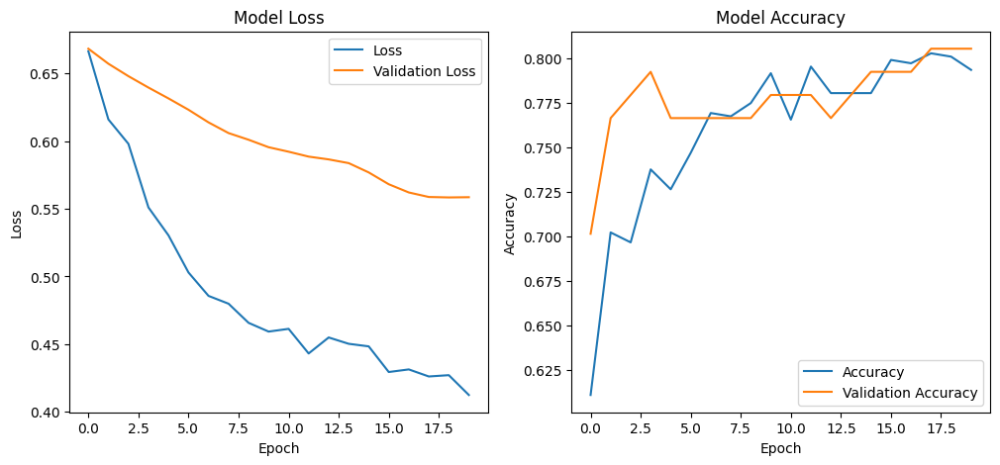

5/5 [==============================] - 0s 4ms/step
Test Loss: 0.5780502557754517
Test Accuracy: 0.7402597665786743
Precision: 0.6190476190476191
Recall: 0.7090909090909091
F1 Score: 0.6610169491525425
Confusion Matrix:
[[75 24]
 [16 39]]


In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, BatchNormalization, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

model = Sequential([
    Dense(100, input_dim=8, activation='relu'),  
    BatchNormalization(),                       
    Dense(50, activation='relu'),               
    Dropout(0.2),                               
    Dense(50, activation='relu'),               
    Dense(20, activation='relu'),                
    Dense(1, activation='sigmoid')              
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=256, verbose=1)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

test_loss, test_accuracy = model.evaluate(X_test, y_test)
y_pred = (model.predict(X_test) > 0.5).astype("int32")

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print("Confusion Matrix:")
print(conf_matrix)


1 if the individual is predicted to have diabetes (diabetic)
0 if the individual is predicted not to have diabetes (non-diabetic)

# PART TWO

### LIME

In [ ]:
import numpy as np
import lime
import lime.lime_tabular

y_test = y_test.reset_index(drop=True)
def model_predict(input_data):
    predictions = model.predict(input_data)
    return np.hstack((1-predictions, predictions))

explain = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'],
    class_names=['Non-diabetic', 'Diabetic'],
    mode='classification',
    verbose=True
)

print("X_test size:", X_test.shape)
print("y_test size:", y_test.shape)

np.random.seed(42)
sample_indices = np.random.choice(X_test.shape[0], 3, replace=False)

print("Sample indices:", sample_indices)

for i, idx in enumerate(sample_indices):
    exp = explain.explain_instance(
        data_row=X_test[idx],
        predict_fn=model_predict,
        num_features=8,
        top_labels=1
    )
    print(f"\nExplaining test sample {i+1} (Index {idx}): Actual label = {y_test[idx]}")
    exp.show_in_notebook(show_table=True, show_all=False)


X_test size: (154, 8)
y_test size: (154,)
Sample indices: [ 15  94 152]
157/157 [==============================] - 0s 2ms/step
Intercept 0.5932981783828641
Prediction_local [0.54569367]
Right: 0.5275856

Explaining test sample 1 (Index 15): Actual label = 1


157/157 [==============================] - 0s 2ms/step
Intercept 0.5948257883727596
Prediction_local [0.51435118]
Right: 0.53062105

Explaining test sample 2 (Index 94): Actual label = 0


157/157 [==============================] - 0s 2ms/step
Intercept 0.6037174894861187
Prediction_local [0.49913732]
Right: 0.54148775

Explaining test sample 3 (Index 152): Actual label = 1


### NAM

In [ ]:
# RESTART AFTER INSTALL
# https://stackoverflow.com/questions/13566200/how-can-i-install-from-a-git-subdirectory-with-pip
!SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True pip3 install -U --verbose -e "git+https://github.com/google-research/google-research.git#egg=neural_additive_models&subdirectory=neural_additive_models" # install a python package from a repo subdirectory

Using pip 23.1.2 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)
Obtaining neural_additive_models from git+https://github.com/google-research/google-research.git#egg=neural_additive_models&subdirectory=neural_additive_models
  Running command git config --get-regexp 'remote\..*\.url'
  remote.origin.url https://github.com/google-research/google-research.git
  Updating ./src/neural-additive-models clone
  Running command git version
  git version 2.34.1
  Running command git fetch -q --tags
  Running command git show-ref HEAD
  e4927610d8ef1e3357c2f6e65ed6932b012f3c2f refs/remotes/origin/HEAD
  Running command git reset --hard -q e4927610d8ef1e3357c2f6e65ed6932b012f3c2f
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-_4utl347/neural_additive_models.egg-info
  writing /tmp/pip-pip-egg-info-_4utl347/neural_additive_models.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-_4utl347/neural_additive_models.egg-i

In [ ]:
!cd /content/src/neural-additive-models/neural_additive_models

In [ ]:
import models as nam_models
import graph_builder


import tensorflow.compat.v2 as tf
tf.enable_v2_behavior()

import data_utils
import models as nam_models
import graph_builder
import os.path as osp
import numpy as np

import matplotlib.pyplot as plt

In [ ]:

tf.compat.v1.reset_default_graph()
nn_model = graph_builder.create_nam_model(
    x_train=X_test,
    dropout=0.2,
    num_basis_functions=256,
    activation='relu',
    trainable=True,
    shallow=False,
    name_scope='model_0')

_ = nn_model(X_test[:1])
nn_model.summary()

Model: "nam"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 feature_nn (FeatureNN)      multiple                  4024      
                                                                 
 feature_nn_1 (FeatureNN)    multiple                  13660     
                                                                 
 feature_nn_2 (FeatureNN)    multiple                  6532      
                                                                 
 feature_nn_3 (FeatureNN)    multiple                  7588      
                                                                 
 feature_nn_4 (FeatureNN)    multiple                  10492     
                                                                 
 feature_nn_5 (FeatureNN)    multiple                  17620     
                                                                 
 feature_nn_6 (FeatureNN)    multiple                  19072   

In [ ]:
import keras

In [ ]:
nn_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss=keras.losses.BinaryCrossentropy(),
    metrics=[
        keras.metrics.BinaryAccuracy(),
    ],
    run_eagerly=True
)

In [ ]:
hist = nn_model.fit(X_train, y_train.astype(np.float64), validation_data=(X_test, y_test.astype(np.float64)), batch_size=1024, epochs=30)

Epoch 1/30
1/1 [==============================] - 10s 10s/step - loss: 4.8433 - binary_accuracy: 0.6480 - val_loss: 2.4532 - val_binary_accuracy: 0.6429
Epoch 2/30
1/1 [==============================] - 1s 751ms/step - loss: 3.5521 - binary_accuracy: 0.6555 - val_loss: 0.8935 - val_binary_accuracy: 0.7078
Epoch 3/30
1/1 [==============================] - 1s 930ms/step - loss: 1.8912 - binary_accuracy: 0.6629 - val_loss: 0.5713 - val_binary_accuracy: 0.7403
Epoch 4/30
1/1 [==============================] - 1s 546ms/step - loss: 1.0620 - binary_accuracy: 0.6834 - val_loss: 0.6302 - val_binary_accuracy: 0.7338
Epoch 5/30
1/1 [==============================] - 1s 708ms/step - loss: 1.1002 - binary_accuracy: 0.6667 - val_loss: 0.9048 - val_binary_accuracy: 0.6818
Epoch 6/30
1/1 [==============================] - 0s 464ms/step - loss: 1.4357 - binary_accuracy: 0.5791 - val_loss: 1.1182 - val_binary_accuracy: 0.6169
Epoch 7/30
1/1 [==============================] - 0s 499ms/step - loss: 1.520

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])


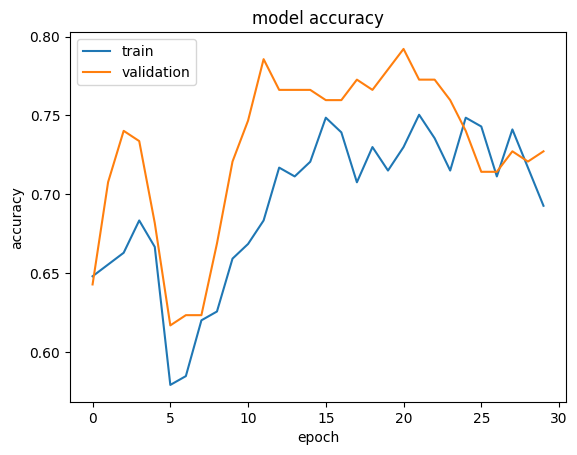

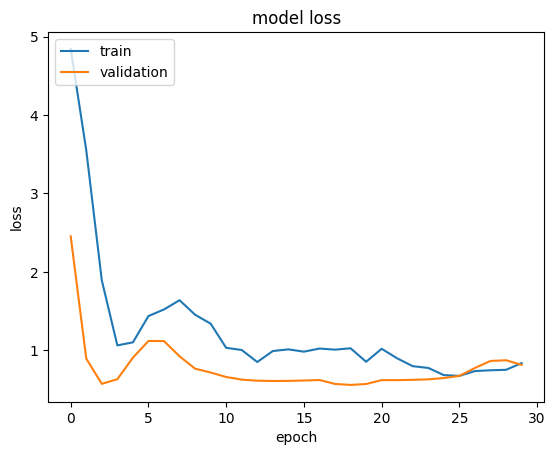

In [ ]:
print(hist.history.keys())

#  "Accuracy"
plt.plot(hist.history['binary_accuracy'])
plt.plot(hist.history['val_binary_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()
# "Loss"
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score
import numpy as np

y_val_pred_probs = model.predict(X_val)
y_val_pred = (y_val_pred_probs > 0.5).astype("int32")

cm = confusion_matrix(y_val, y_val_pred)
print("Confusion Matrix:\n", cm)

precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)
accuracy = accuracy_score(y_val, y_val_pred)

print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print(f"Accuracy: {accuracy}")


3/3 [==============================] - 0s 5ms/step
Confusion Matrix:
 [[49  4]
 [ 8 16]]
Precision: 0.8
Recall: 0.6666666666666666
F1 Score: 0.7272727272727272
Accuracy: 0.8441558441558441


In [ ]:
import seaborn as sn

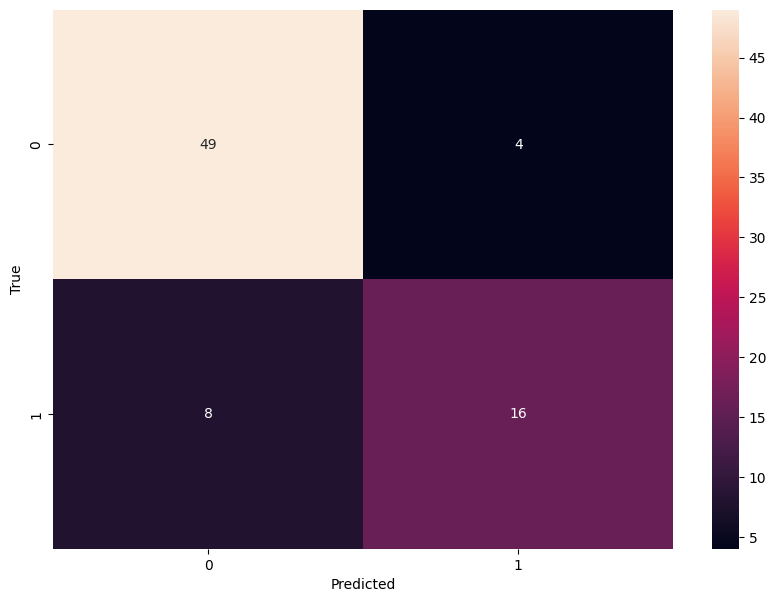

In [ ]:
df_cm = pd.DataFrame(cm, index = [i for i in "01"], columns = [i for i in "01"])

plt.figure(figsize = (10,7))
sn.heatmap(df_cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

## New NAM

In [ ]:
!unzip /content/nam.zip -d /content/nam

Archive:  /content/nam.zip
  inflating: /content/nam/__init__.py  
  inflating: /content/nam/__MACOSX/.___init__.py  
   creating: /content/nam/config/
  inflating: /content/nam/__MACOSX/._config  
  inflating: /content/nam/config/__init__.py  
  inflating: /content/nam/__MACOSX/config/.___init__.py  
  inflating: /content/nam/config/default.py  
  inflating: /content/nam/__MACOSX/config/._default.py  
  inflating: /content/nam/config/base.py  
  inflating: /content/nam/__MACOSX/config/._base.py  
   creating: /content/nam/data/
  inflating: /content/nam/__MACOSX/._data  
  inflating: /content/nam/data/folded.py  
  inflating: /content/nam/__MACOSX/data/._folded.py  
  inflating: /content/nam/data/datasets.py  
  inflating: /content/nam/__MACOSX/data/._datasets.py  
  inflating: /content/nam/data/__init__.py  
  inflating: /content/nam/__MACOSX/data/.___init__.py  
  inflating: /content/nam/data/utils.py  
  inflating: /content/nam/__MACOSX/data/._utils.py  
  inflating: /content/nam/d

In [ ]:
!ls

config	diabetes.csv  __MACOSX	nam	 sample_data  trainer	utils
data	__init__.py   models	nam.zip  src	      types.py


In [ ]:
!pip install loguru wandb ray -q

In [ ]:
import pytorch_lightning as pl
from pytorch_lightning.callbacks.model_checkpoint import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

from nam.config import defaults
from nam.data import FoldedDataset
from nam.data import NAMDataset
from nam.models import NAM
from nam.models import get_num_units
from nam.trainer import LitNAM
from nam.types import Config
from nam.utils import parse_args
from nam.utils import plot_mean_feature_importance
from nam.utils import plot_nams

In [ ]:
from nam.data.base import NAMDataset

In [ ]:
!cat /content/diabetes.csv

Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
6,148,72,35,0,33.6,0.627,50,1
1,85,66,29,0,26.6,0.351,31,0
8,183,64,0,0,23.3,0.672,32,1
1,89,66,23,94,28.1,0.167,21,0
0,137,40,35,168,43.1,2.288,33,1
5,116,74,0,0,25.6,0.201,30,0
3,78,50,32,88,31,0.248,26,1
10,115,0,0,0,35.3,0.134,29,0
2,197,70,45,543,30.5,0.158,53,1
8,125,96,0,0,0,0.232,54,1
4,110,92,0,0,37.6,0.191,30,0
10,168,74,0,0,38,0.537,34,1
10,139,80,0,0,27.1,1.441,57,0
1,189,60,23,846,30.1,0.398,59,1
5,166,72,19,175,25.8,0.587,51,1
7,100,0,0,0,30,0.484,32,1
0,118,84,47,230,45.8,0.551,31,1
7,107,74,0,0,29.6,0.254,31,1
1,103,30,38,83,43.3,0.183,33,0
1,115,70,30,96,34.6,0.529,32,1
3,126,88,41,235,39.3,0.704,27,0
8,99,84,0,0,35.4,0.388,50,0
7,196,90,0,0,39.8,0.451,41,1
9,119,80,35,0,29,0.263,29,1
11,143,94,33,146,36.6,0.254,51,1
10,125,70,26,115,31.1,0.205,41,1
7,147,76,0,0,39.4,0.257,43,1
1,97,66,15,140,23.2,0.487,22,0
13,145,82,19,110,22.2,0.245,57,0
5,117,92,0,0,34.1,0.337,38,0
5,10

In [ ]:
config = defaults()

In [ ]:
config.lr = 1e-2
config.num_basis_functions = 256
config.batch_size = 128
config.num_epochs = 30
config.num_models = 3

In [ ]:
print(config)

Config(device='cpu', seed=2021, data_path='data/GALLUP.csv', experiment_name='NAM', regression=False, num_epochs=30, lr=0.01, batch_size=128, logdir='output', wandb=False, hidden_sizes=[], activation='exu', dropout=0.1, feature_dropout=0.1, decay_rate=0.995, l2_regularization=0.1, output_regularization=0.1, num_basis_functions=256, units_multiplier=2, shuffle=False, cross_val=False, num_folds=5, num_splits=3, fold_num=1, num_models=3, num_workers=16, save_model_frequency=2, save_top_k=3, use_dnn=False, early_stopping_patience=50)


In [ ]:
dataset = NAMDataset(config, data_path='/content/diabetes.csv', features_columns=["Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"], targets_column="Outcome")

In [ ]:
trainloader, valloader = dataset.train_dataloaders()

In [ ]:
model = NAM(
  config=config,
  name="DIABETES",
  num_inputs=len(dataset[0][0]),
  num_units=get_num_units(config, dataset.features),
)

/usr/local/lib/python3.10/dist-packages/torch/nn/init.py:205: UserWarning: mean is more than 2 std from [a, b] in nn.init.trunc_normal_. The distribution of values may be incorrect.
  return _no_grad_trunc_normal_(tensor, mean, std, a, b, generator=generator)


In [ ]:
tb_logger = TensorBoardLogger(save_dir=config.logdir,
                                name=f'{model.name}',
                                version=f'DIABETES_1',
                              log_graph=True)

In [ ]:
from torch import nn
from torchmetrics import Accuracy, Precision, Recall, F1Score, ConfusionMatrix, MetricCollection
from pytorch_lightning import LightningModule
import torch


class MyNAM(LitNAM):
    def __init__(self, config: Config, model: nn.Module) -> None:
        super().__init__(config, model)

        self.train_metrics = MetricCollection([F1Score(task="binary"), Recall(task="binary"), Precision(task="binary"), Accuracy(task="binary")])
        self.valid_metrics = MetricCollection([F1Score(task="binary"), Recall(task="binary"), Precision(task="binary"), Accuracy(task="binary")])

        self.test_metrics = MetricCollection([F1Score(task="binary"), Recall(task="binary"), Precision(task="binary"), Accuracy(task="binary"), ConfusionMatrix(task="binary")])

    def training_step(self, batch, batch_idx):
        features, targets = batch

        logits, fnns_out = self.model(features)
        loss = self.criterion(logits, targets, None, fnns_out, self.model)
        metric = self.metrics(logits, targets)

        targets = targets.squeeze()

        self.train_metrics.update(logits, targets)

        self.log_dict(
            {
                'train_loss': loss,
                f"{self.metrics_name}_metric": metric
            },
            on_step=True,
            on_epoch=True,
            prog_bar=True,
            logger=True,
        )

        return loss  

    def test_step(self, batch, batch_idx):
        features, targets = batch

        logits, fnns_out = self.model(features)
        loss = self.criterion(logits, targets, None, fnns_out, self.model)
        metric = self.metrics(logits, targets)

        targets = targets.squeeze()

        self.test_metrics.update(logits, targets)

        self.log_dict(
            {
                'test_loss': loss,
                f"{self.metrics_name}_metric": metric
            },
            on_step=True,
            on_epoch=True,
            prog_bar=True,
            logger=True,
        )

        return {'test_loss': loss}

    def validation_step(self, batch, batch_idx):
        features, targets = batch

        logits, fnns_out = self.model(features)  
        loss = self.criterion(logits, targets, None, fnns_out, self.model)
        metric = self.metrics(logits, targets)

        targets = targets.squeeze()

        self.valid_metrics.update(logits, targets)

        self.log_dict(
            {
                'val_loss': loss,
                f"{self.metrics_name}_metric_val": metric
            },
            on_step=True,
            on_epoch=True,
            prog_bar=True,
            logger=True,
        )

        return {'val_loss': loss}


litmodel = MyNAM(config, model)
trainer = pl.Trainer(max_epochs=config.num_epochs, logger=tb_logger)

trainer.fit(litmodel,
          train_dataloaders=trainloader,
          val_dataloaders=valloader)

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/callbacks/model_checkpoint.py:653: Checkpoint directory output/DIABETES/DIABETES_1/checkpoints exists and is not empty.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name          | Type             | Params
---------------------------------------------------
0 | model         | NAM              | 2.7 K 
1 | train_metrics | MetricCollection | 0     
2 | valid_metrics | MetricCollection | 0     
3 | test_metrics  | MetricCollection | 0     
---------------------------------------------------
2.7 K     Trainable params
0         Non-trainable params
2.7 K     Total params
0.011     Total estimated model params size (MB)
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loggers/tensorboard.py:194: Could not log computational graph to TensorBoard: The `model.example_input_array` attribute is not set or `input_array` was not given.


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loops/fit_loop.py:298: The number of training batches (5) is smaller than the logging interval Trainer(log_every_n_steps=50). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

[(<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryF1Score'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryRecall'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryPrecision'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryAccuracy'>)]

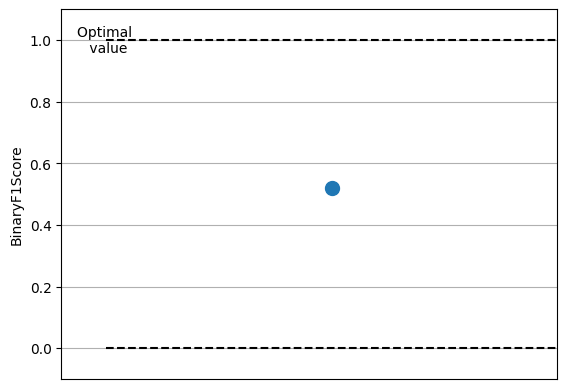

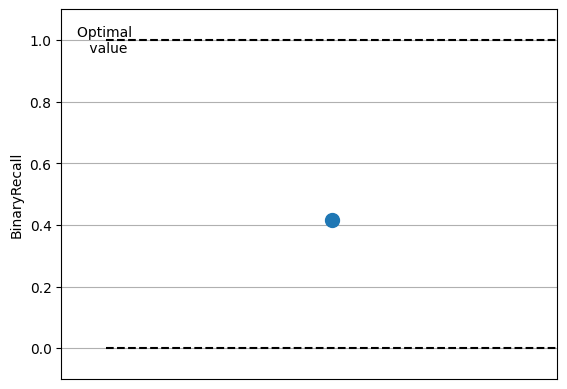

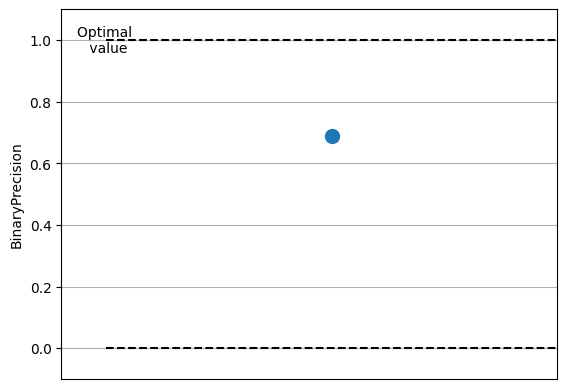

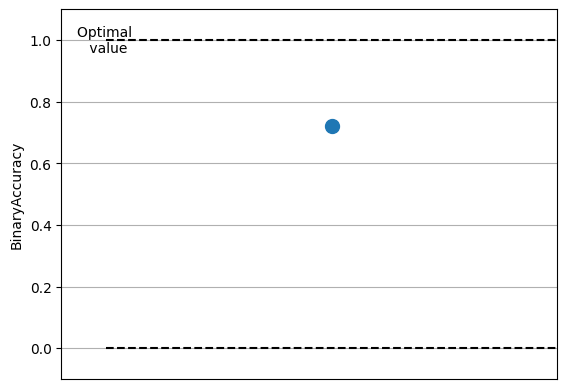

In [ ]:
litmodel.train_metrics.plot()

[(<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryF1Score'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryRecall'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryPrecision'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryAccuracy'>)]

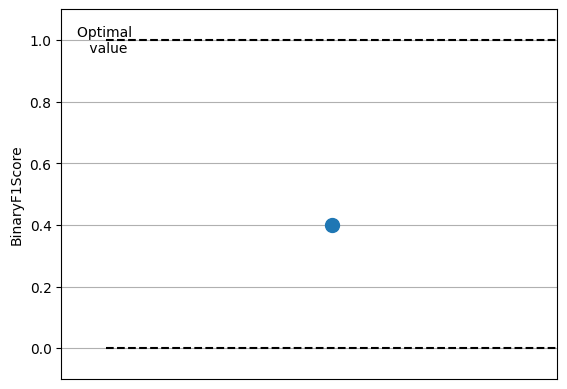

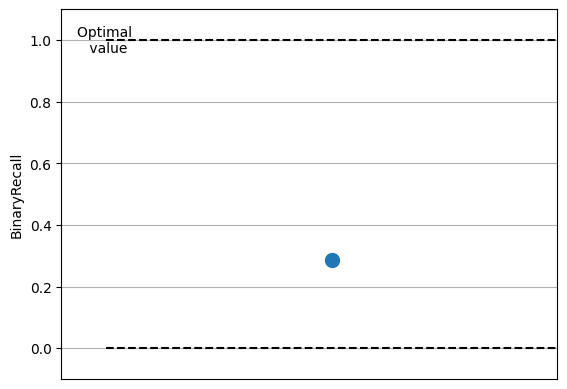

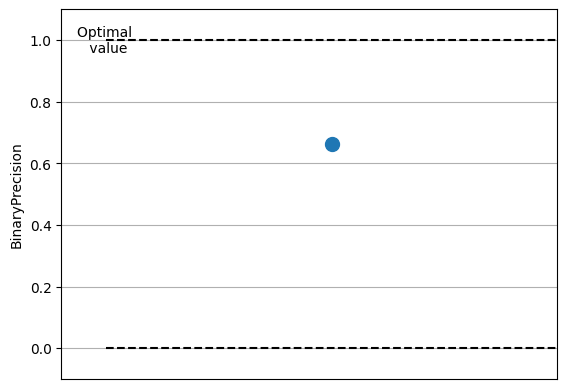

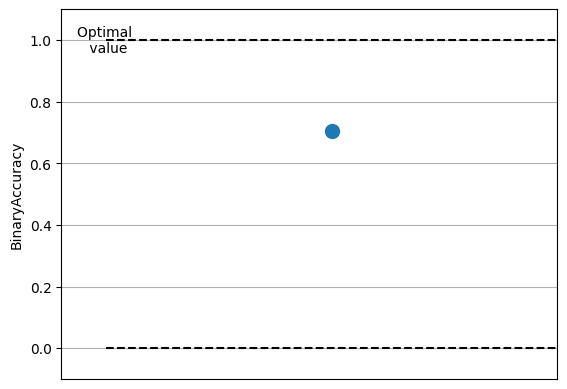

In [ ]:
litmodel.valid_metrics.plot()

In [ ]:
trainer.test(dataloaders=dataset.test_dataloaders())

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:145: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/loggers/tensorboard.py:194: Could not log computational graph to TensorBoard: The `model.example_input_array` attribute is not set or `input_array` was not given.


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│   Accuracy_metric_epoch   │    0.7450980544090271     │
│      test_loss_epoch      │     0.508449137210846     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss_epoch': 0.508449137210846,
  'Accuracy_metric_epoch': 0.7450980544090271}]

[(<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryF1Score'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryRecall'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryPrecision'>),
 (<Figure size 640x480 with 1 Axes>, <Axes: ylabel='BinaryAccuracy'>),
 (<Figure size 640x480 with 1 Axes>,
  <Axes: xlabel='Predicted class', ylabel='True class'>)]

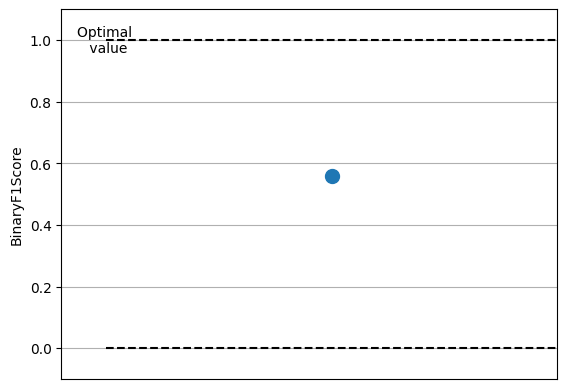

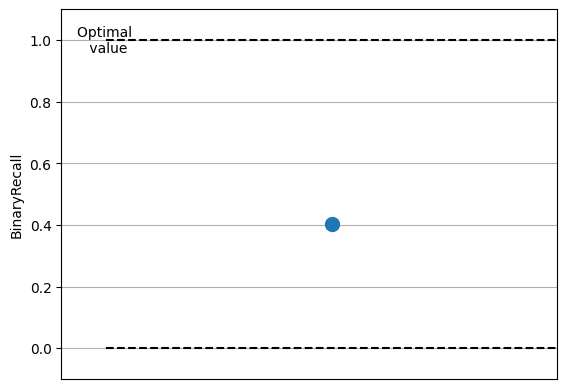

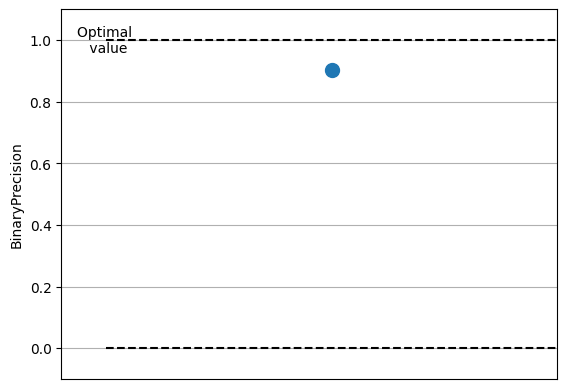

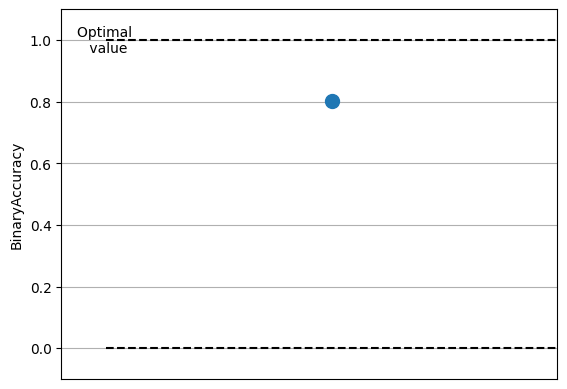

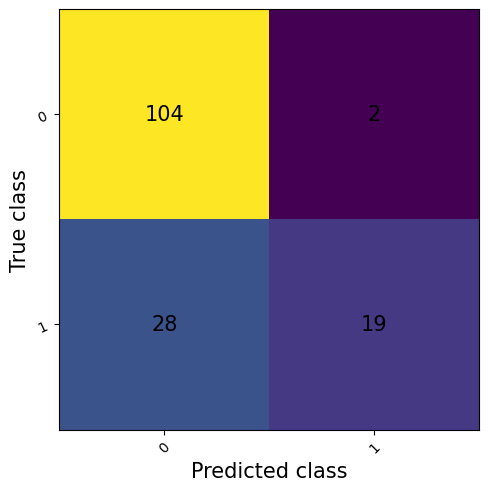

In [ ]:
litmodel.test_metrics.plot()

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
!pkill tensorboard

In [ ]:
%tensorboard --logdir /content/output/DIABETES

<IPython.core.display.Javascript object>

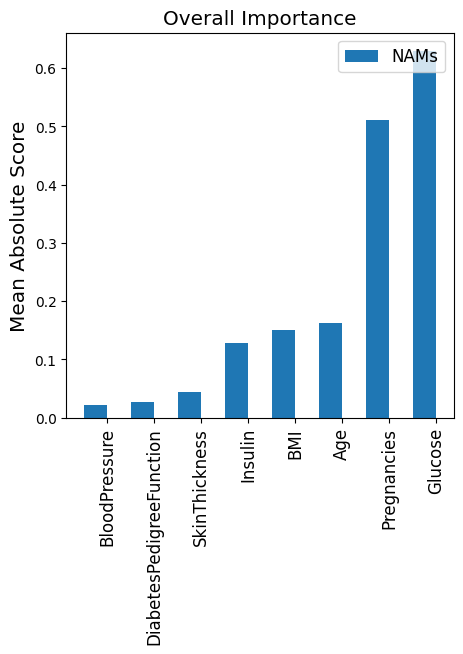

In [ ]:
fig = plot_mean_feature_importance(litmodel.model, dataset)

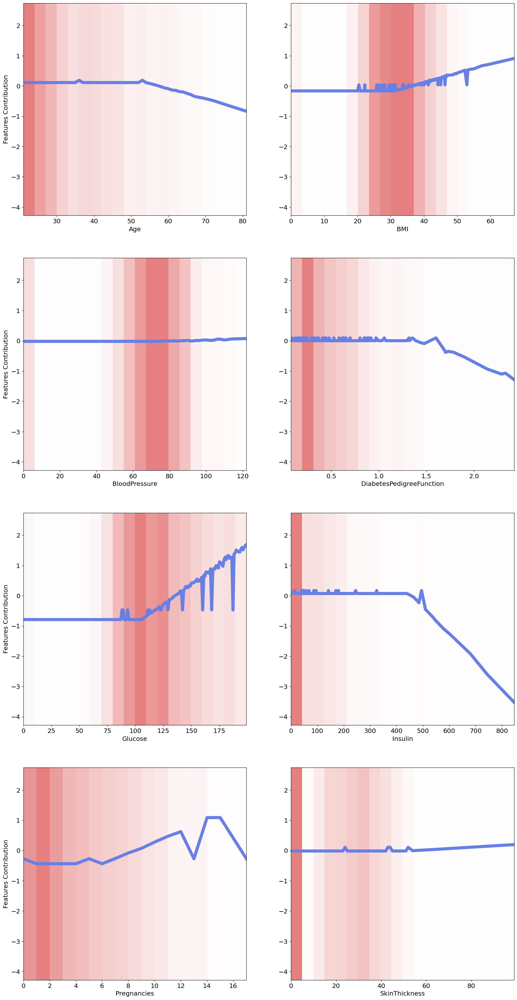

In [ ]:
fig = plot_nams(litmodel.model, dataset, num_cols= 2)

## Shap

In [ ]:
def model_predict(input_data):
    return model.predict(input_data).flatten()

background = X_train[np.random.choice(X_train.shape[0], 100, replace=False)]
explainer = shap.KernelExplainer(model_predict, background)
indices_to_explain = [15, 94, 152]  

shap.initjs()  
for idx in indices_to_explain:
    shap_values = explainer.shap_values(X_test[idx:idx+1])
    display(shap.force_plot(explainer.expected_value, shap_values[0], X_test[idx], feature_names=X.columns))

4/4 [==============================] - 0s 11ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

794/794 [==============================] - 4s 5ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

794/794 [==============================] - 4s 5ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

794/794 [==============================] - 3s 4ms/step


Epoch 1/20
3/3 [==============================] - 3s 191ms/step - loss: 0.7392 - accuracy: 0.4227 - val_loss: 0.6897 - val_accuracy: 0.5714
Epoch 2/20
3/3 [==============================] - 0s 37ms/step - loss: 0.6910 - accuracy: 0.5270 - val_loss: 0.6828 - val_accuracy: 0.7013
Epoch 3/20
3/3 [==============================] - 0s 38ms/step - loss: 0.6572 - accuracy: 0.6220 - val_loss: 0.6768 - val_accuracy: 0.7922
Epoch 4/20
3/3 [==============================] - 0s 38ms/step - loss: 0.6296 - accuracy: 0.6946 - val_loss: 0.6707 - val_accuracy: 0.7792
Epoch 5/20
3/3 [==============================] - 0s 36ms/step - loss: 0.6099 - accuracy: 0.7151 - val_loss: 0.6638 - val_accuracy: 0.7922
Epoch 6/20
3/3 [==============================] - 0s 37ms/step - loss: 0.5878 - accuracy: 0.7356 - val_loss: 0.6565 - val_accuracy: 0.8182
Epoch 7/20
3/3 [==============================] - 0s 57ms/step - loss: 0.5705 - accuracy: 0.7169 - val_loss: 0.6493 - val_accuracy: 0.8052
Epoch 8/20
3/3 [==========

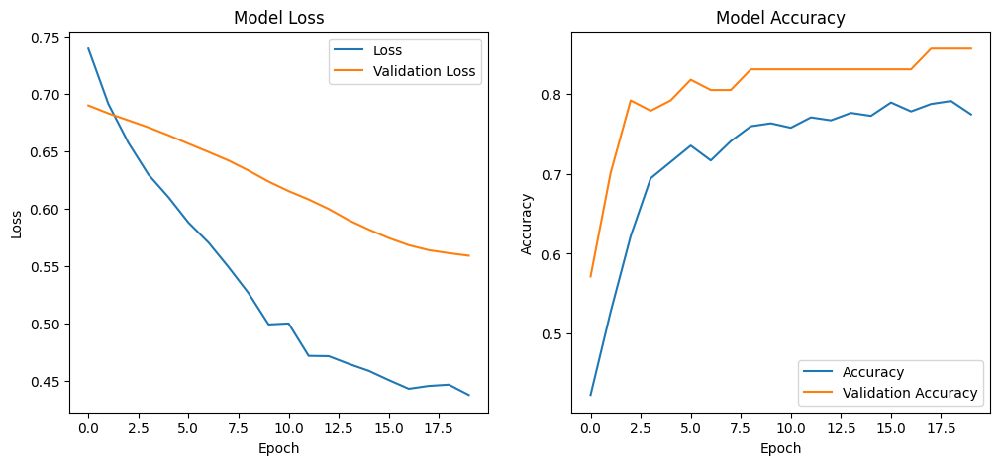

5/5 [==============================] - 0s 3ms/step
Test Loss: 0.5975969433784485
Test Accuracy: 0.7337662577629089
Precision: 0.6206896551724138
Recall: 0.6545454545454545
F1 Score: 0.6371681415929203
Confusion Matrix:
[[77 22]
 [19 36]]


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
model = Sequential([
    Dense(100, input_dim=8, activation='relu'),  
    BatchNormalization(),                       
    Dense(50, activation='relu'),                
    Dropout(0.2),                               
    Dense(50, activation='relu'),               
    Dense(20, activation='relu'),                
    Dense(1, activation='sigmoid')               
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=256, verbose=1)


plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

test_loss, test_accuracy = model.evaluate(X_test, y_test)
y_pred = (model.predict(X_test) > 0.5).astype("int32")

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Test Loss: {test_loss}")
print(f"Test Accuracy: {test_accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print("Confusion Matrix:")
print(conf_matrix)


model.save('/content/my_model.h5')

4/4 [==============================] - 0s 6ms/step


  0%|          | 0/154 [00:00<?, ?it/s]

794/794 [==============================] - 1s 1ms/step


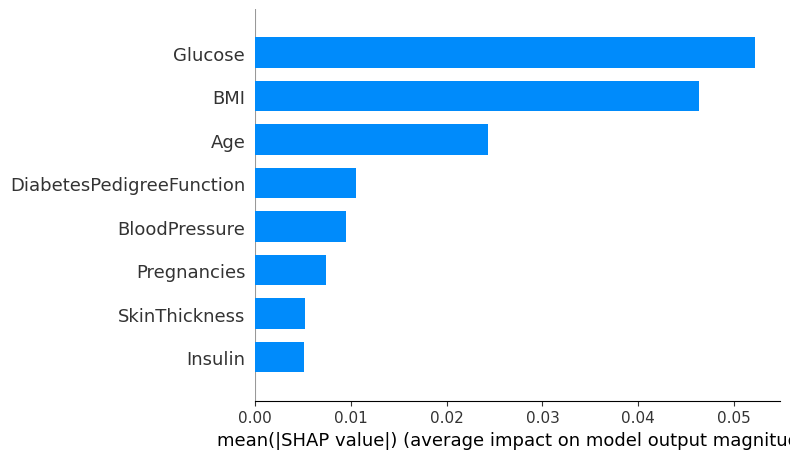

157/157 [==============================] - 0s 2ms/step


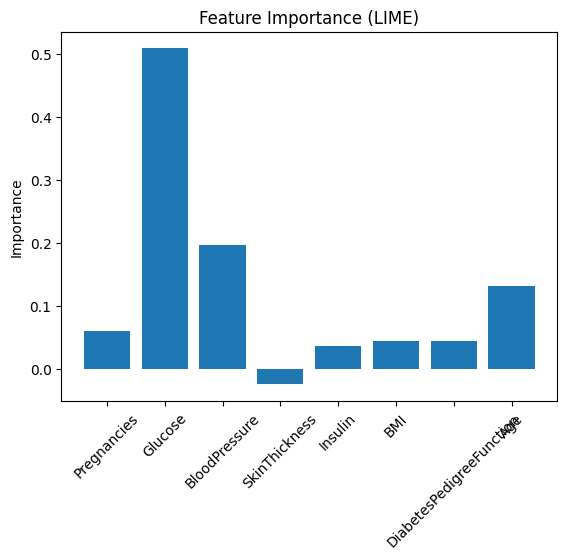

In [ ]:
model = load_model('/content/my_model.h5')

def model_predict_for_lime(input_data):
    predictions = model.predict(input_data)
    return np.hstack((1-predictions, predictions))

def model_predict_for_shap(input_data):
    return model.predict(input_data).flatten()

background = X_train[np.random.choice(X_train.shape[0], 100, replace=False)]
explainer_shap = shap.KernelExplainer(model_predict_for_shap, background)
shap_values = explainer_shap.shap_values(X_test)

shap.summary_plot(shap_values, X_test, feature_names=diabet.columns[:-1], plot_type="bar")

explain_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train,
    feature_names=diabet.columns[:-1],
    class_names=['Non-diabetic', 'Diabetic'],
    mode='classification'
)

# Aggregate LIME feature importance
feature_importance = np.zeros(len(diabet.columns) - 1)

for idx in np.random.choice(X_test.shape[0], 100, replace=False):  
    exp = explain_lime.explain_instance(
        data_row=X_test[idx],
        predict_fn=model_predict_for_lime,  
        num_features=len(diabet.columns) - 1
    )
    weights = dict(exp.as_list())
    for feature, weight in weights.items():
        base_feature = re.split('<=|>=|<|>', feature)[0].strip()  
        if base_feature in diabet.columns[:-1].tolist():
            feature_index = diabet.columns[:-1].tolist().index(base_feature)
            feature_importance[feature_index] += weight

feature_importance /= np.sum(feature_importance)
plt.figure()
plt.bar(diabet.columns[:-1], feature_importance)
plt.title('Feature Importance (LIME)')
plt.xticks(rotation=45)
plt.ylabel('Importance')
plt.show()
